In [13]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import jsonlines as jl

# Set data path

In [29]:
images_dir = "/home/rsr/gyl/RS_DATASET/FBP/train/rgb_images"
labels_dir = "/home/rsr/gyl/RS_DATASET/FBP/train/gid_labels"

In [30]:
json_path = "/home/rsr/gyl/RS_Code/sam-hq/uhr_scripts/gid_boxes.jsonl"

# Read json information

In [31]:
json_info = []
with jl.open(json_path, 'r') as f:
    for line in f:
       json_info.append(line) 

# Show boxes

In [32]:
def show_boxes(boxes, category):
    ax = plt.gca()
    ax.set_autoscale_on(False)
    for index, box in enumerate(boxes):
        x, y, w, h = box
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.text(x + w, y, category[index], fontsize=12, verticalalignment='top')

# Color palette

In [33]:
gid_colors = {
    0: (0,0,0),
    1: (255,0,0), # built-up
    2: (0,255,0), # farmland
    3: (0,255,255), # forest
    4: (255,255,0), # meadow
    5: (0,0,255) # water
}

# Process the information

In [47]:
data = json_info[3]

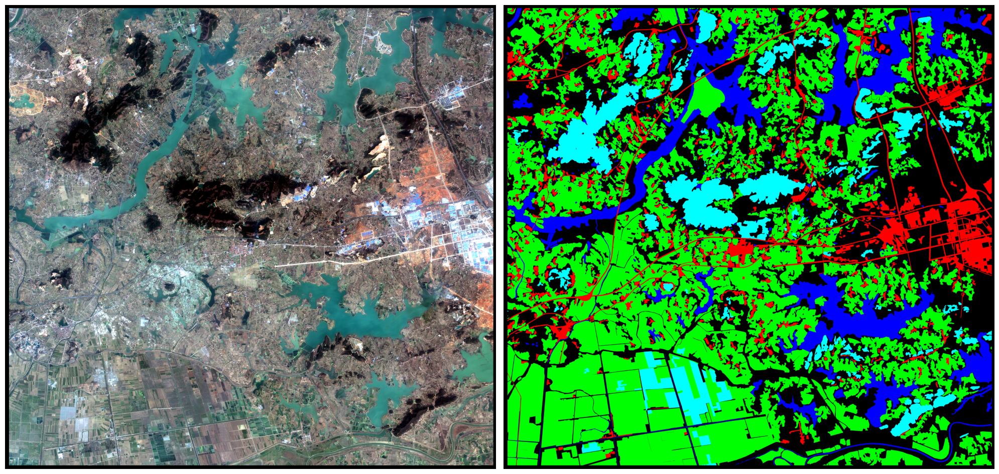

In [48]:
# load image
img_name = data["image_name"]
img_path = os.path.join(images_dir, img_name)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# load mask
mask_path = os.path.join(labels_dir, img_name.split('.')[0]+'_5label.png')
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
rgb_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
for idx, color in gid_colors.items():
    rgb_mask[mask == idx] = color
fig, axs = plt.subplots(1,2, figsize=(20,10))
axs[0].imshow(image)
axs[0].axis('off')
axs[1].imshow(rgb_mask)
axs[1].axis('off')
plt.tight_layout()
plt.show()

# Separate images and masks are displayed

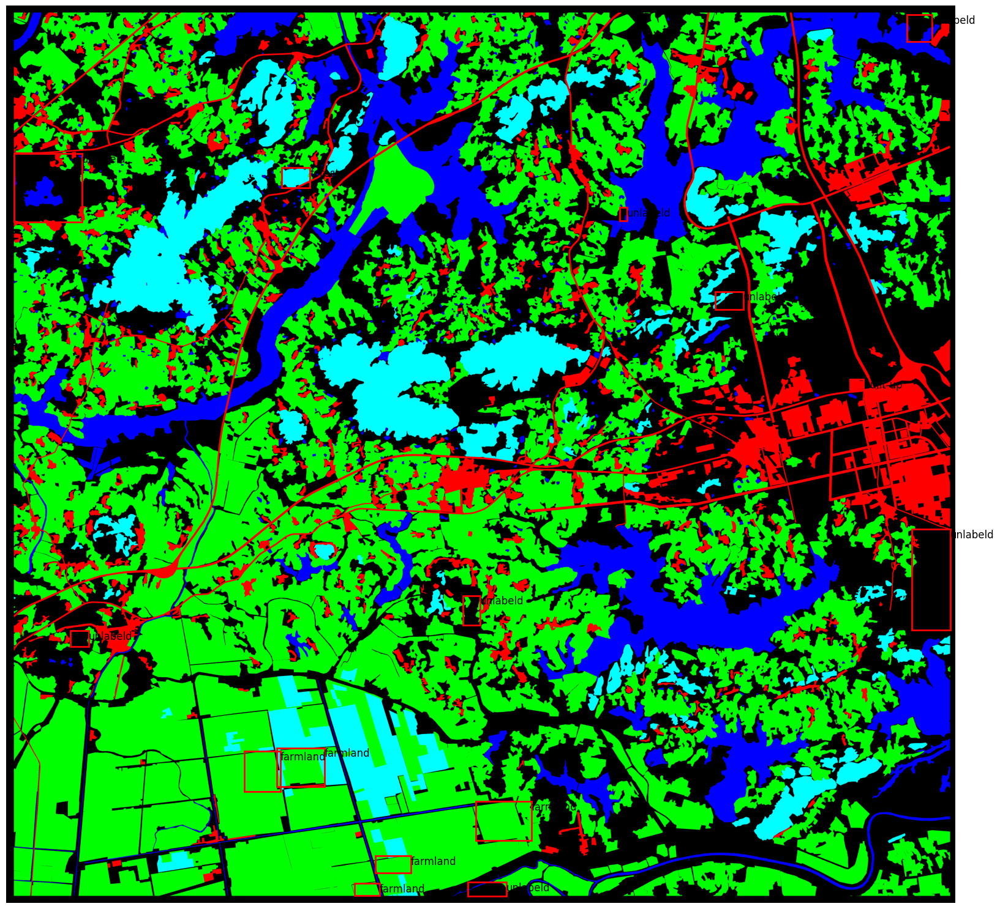

In [49]:
plt.figure(figsize=(20,20))
plt.imshow(rgb_mask)
show_boxes(data["boxes"], data["category"])
plt.axis('off')
plt.show()

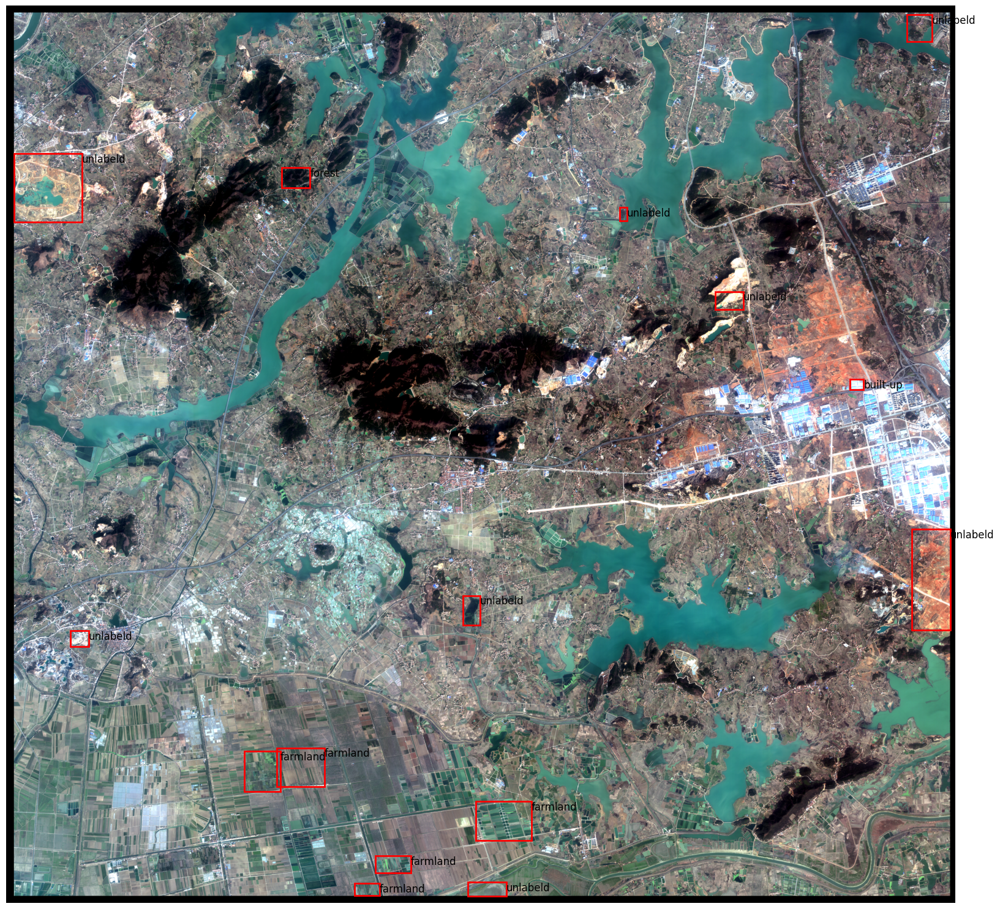

In [50]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_boxes(data["boxes"], data["category"])
plt.axis('off')
plt.show()